In [1]:
%matplotlib inline

# Assuming we are in the notebooks directory, we need to move one up:
%cd ../..

/Users/olivia/Code/neural_link_SV_iDE


In [2]:
import numpy as np
import pandas as pd
import glob
import seaborn as sns

import matplotlib.pyplot as plt
import statsmodels.api as sm

from IPython import display



sns.set(font_scale=1.8)
sns.set_style('ticks')

# Replace with directory you have downloaded NARPS data from:
path = './data/fMRI/confounds/' 
files = glob.glob(path + '*.tsv')
files.sort()

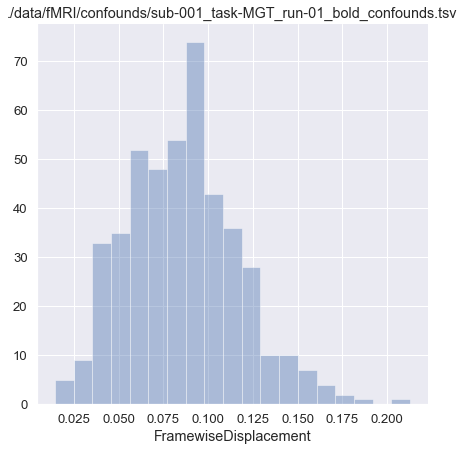

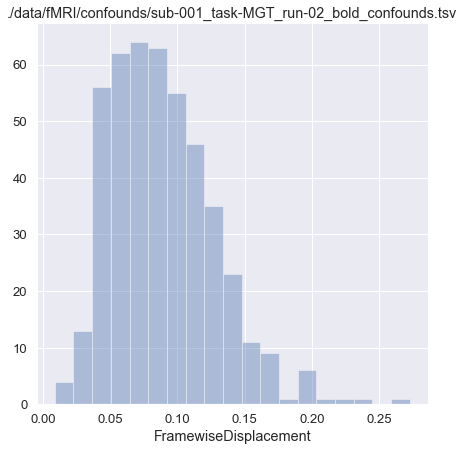

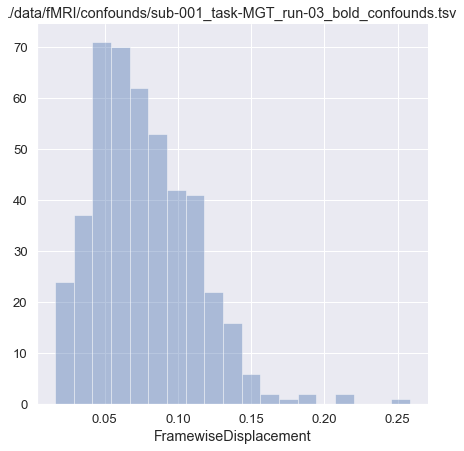

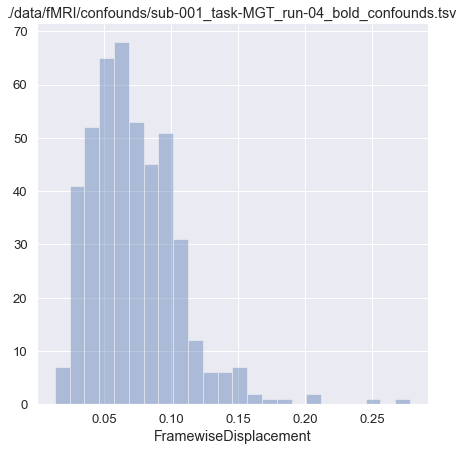

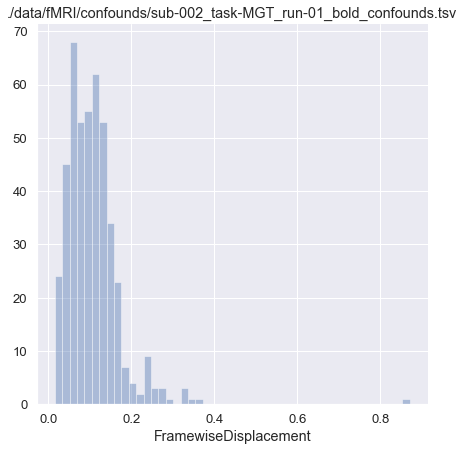

...

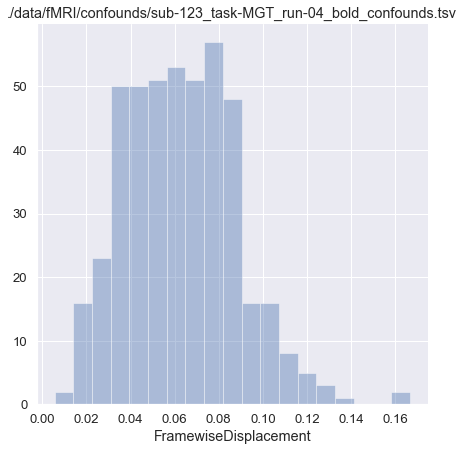

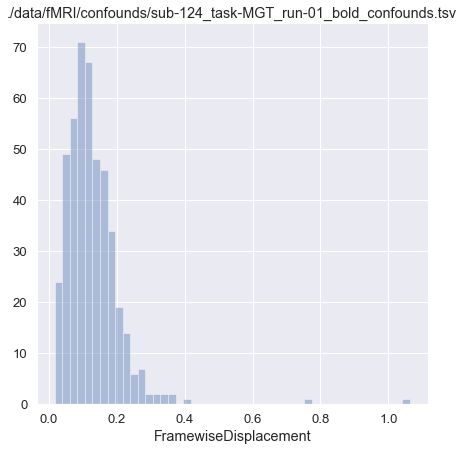

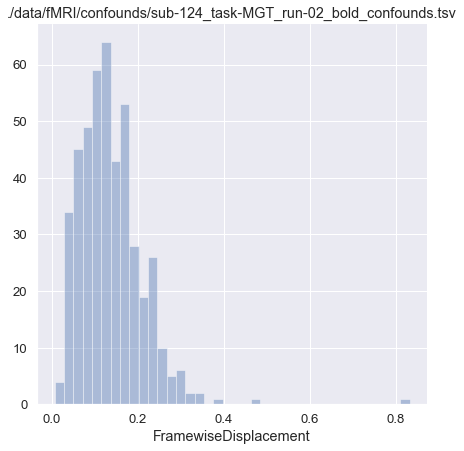

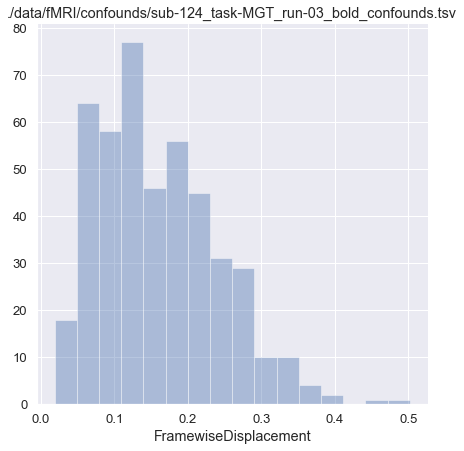

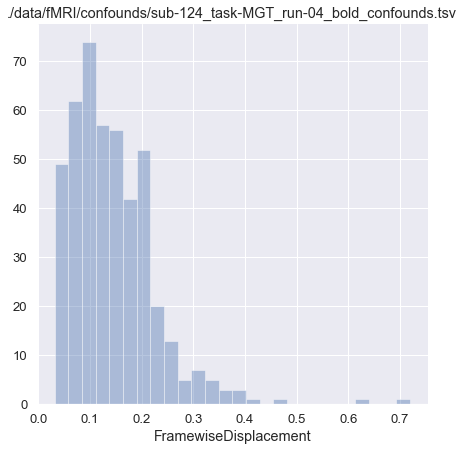

In [3]:
for file in files:
    df = pd.read_csv(file, sep='\t')
    sns.set(font_scale=1.2)

    f, ax = plt.subplots(1, 1, figsize=(7, 7), sharex=True)
    sns.despine(right=True)
    ax.set_title(file)

    sns.distplot(df['FramewiseDisplacement'].dropna(), ax=ax, norm_hist = False , kde=False)

    display.display(f)
    plt.close()

In [4]:
df

,CSF,WhiteMatter,GlobalSignal,stdDVARS,non-stdDVARS,vx-wisestdDVARS,FramewiseDisplacement,tCompCor00,tCompCor01,tCompCor02,...,NonSteadyStateOutlier02,NonSteadyStateOutlier03,NonSteadyStateOutlier04,NonSteadyStateOutlier05,X,Y,Z,RotX,RotY,RotZ
0,6910.7373,6196.0713,9595.3190,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,-0.023338,-0.014373,-0.036883,0.000818,0.000216,-0.000324
1,6811.3994,6181.3076,9537.3000,1.071056,59.692848,1.046572,0.127229,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000044,-0.059584,-0.024729,0.000468,0.000471,0.000000
2,6789.8860,6206.4434,9532.7570,1.088761,60.679573,1.051154,0.237254,0.000000,0.000000,0.000000,...,1.0,0.0,0.0,0.0,0.010049,0.061814,0.027648,-0.000450,0.000319,0.000000
3,6742.0225,6192.2280,9491.7200,1.082848,60.350056,1.047215,0.227717,0.000000,0.000000,0.000000,...,0.0,1.0,0.0,0.0,-0.013644,-0.038012,-0.004127,0.000152,-0.000444,0.000083
4,6733.5000,6219.4450,9487.2970,1.120234,62.433693,1.057239,0.294257,0.000000,0.000000,0.000000,...,0.0,0.0,1.0,0.0,0.000055,0.094018,0.068125,-0.000844,0.000002,0.000000
5,6751.0654,6200.5044,9465.5130,1.139220,63.491814,1.076374,0.297015,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,1.0,-0.003868,-0.051752,-0.007141,0.000134,-0.000461,0.000000
6,6698.9824,6188.5570,9431.2150,1.073550,59.831829,1.031055,0.214841,-0.055169,0.014969,-0.011514,...,0.0,0.0,0.0,0.0,-0.011228,0.043721,0.055598,-0.000834,-0.000478,0.000000
7,6704.8120,6189.5710,9426.8150,1.075802,59.957371,1.021653,0.187435,0.066299,-0.030159,0.017108,...,0.0,0.0,0.0,0.0,-0.014830,-0.037259,0.011730,-0.000097,-0.000797,0.000123
8,6680.8640,6177.0470,9416.1750,1.060349,59.096123,1.007990,0.114929,-0.024428,0.059019,0.026211,...,0.0,0.0,0.0,0.0,-0.018803,0.020212,0.044165,-0.000345,-0.000948,0.000101
9,6729.3335,6188.2773,9432.5250,1.121413,62.499378,1.050183,0.104117,-0.033058,-0.070264,0.033726,...,0.0,0.0,0.0,0.0,-0.012926,0.049174,0.056866,-0.001249,-0.000787,0.000168


In [5]:
df[['FramewiseDisplacement', 'X', 'Y', 'Z', 'RotX', 'RotY', 'RotZ']].describe()

,FramewiseDisplacement,X,Y,Z,RotX,RotY,RotZ
count,452.000000,453.000000,453.000000,453.000000,453.000000,453.000000,453.000000
mean,0.144676,-0.011745,0.049750,0.222296,-0.004680,0.000264,-0.000729
std,0.082607,0.012285,0.055772,0.121978,0.002116,0.000672,0.000497
min,0.031946,-0.035976,-0.123767,-0.036883,-0.011369,-0.001116,-0.001799
25%,0.086223,-0.019353,0.012844,0.114979,-0.005401,-0.000275,-0.001033
50%,0.127529,-0.012988,0.049189,0.217606,-0.004622,-0.000008,-0.000696
75%,0.188837,-0.007865,0.090594,0.301004,-0.003448,0.000900,-0.000377
max,0.718862,0.051126,0.180382,0.571674,0.003709,0.001793,0.000441


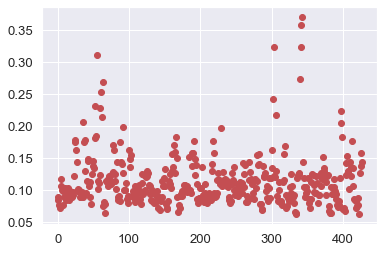

In [6]:
sums = []
means = []
for file in files:
    if 'sub-030' in file:
        continue
    df = pd.read_csv(file, sep='\t')
    means.append(df['FramewiseDisplacement'].mean())
plt.plot(range(len(means)), means, 'ro')
plt.show()

/Users/olivia/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


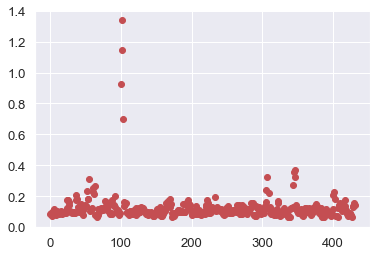

In [7]:
# try: 
#     del all_df
# except:
#     pass

sums = []
means = []
for file in files:
#     print(file)
    df = pd.read_csv(file, sep='\t')
    means.append(df['FramewiseDisplacement'].mean())
    df['ID'] = str(int(file.split('-')[1].split('_')[0]))
    try:
        all_df = all_df.append(df)
    except NameError:
        all_df = df
plt.plot(range(len(means)), means, 'ro')
plt.show()

In [8]:
mean = all_df['FramewiseDisplacement'].mean()
std = all_df['FramewiseDisplacement'].std()

for index, row in all_df.iterrows():
    if (row['FramewiseDisplacement'] > mean + std * 4):
        print(row['FramewiseDisplacement'], row['ID'])

1.41267195 2
0.93447725 3
1.4020676 8
0.94513125 8
1.17926795 8
0.9659856 8
1.02524613 8
0.9169295 8
1.0053662 8
0.9543819 11
1.1999594 13
0.9306144500000002 13
1.39899395 13
1.0612778999999999 13
1.290683 13
1.2019326565000001 13
1.2656522934999999 13
1.0274563799999998 13
0.9407358 13
1.65243451 13
0.9226638 13
1.06011291 13
1.2910540499999998 13
2.1845109000000003 13
1.4534311000000002 13
1.19565135 15
1.30876965 15
0.99944915 15
0.90925549 15
0.9045493665000001 16
2.5716185 16
1.8344593999999996 16
1.8864129 16
1.6433129599999998 16
1.4276342540000002 16
1.04882103 16
0.97836875 16
1.13291555 16
2.7483839 16
1.4004772 16
1.2628922499999995 16
0.9081877465000001 16
1.90477674 16
1.0726144999999998 16
1.4469495 16
1.08225415 16
1.1322015000000003 16
0.9947114999999996 16
1.2493313 16
1.2414475 16
1.1211643999999998 16
1.0681235000000002 16
1.1936581 16
2.836432 16
1.0752307 16
1.3747121999999998 16
0.8936854999999999 16
1.2462320210000002 16
1.15687825 16
0.9115509327 16
0.9616345 16

2.2670292 30
9.3655225 30
0.999086 30
3.5414859999999995 30
1.2217995000000006 30
1.9824289000000002 30
7.843457499999999 30
0.9403438999999998 30
1.7497359000000001 30
1.0229825000000001 30
2.9579266500000005 30
3.2010065 30
0.9574904999999998 30
0.9676340000000002 30
1.08517951 30
1.00881531 30
3.0336178500000006 30
1.046806 30
1.1856308999999998 30
1.4492913000000005 30
1.1974109999999998 30
1.1436568999999999 30
1.596349 30
0.9183237 32
0.9386915000000001 32
0.93001361 32
0.9743849750000002 32
0.9059969200000002 35
3.2467148 36
1.0547166000000001 37
2.12047 37
1.1785860000000001 37
0.8954605 37
0.9153023000000001 39
0.9227923000000002 39
1.356073585 39
1.12756035 39
1.35984837 39
1.14239945 39
0.9715804849999998 50
1.4521859716 50
1.14164415 50
1.05791103 50
1.1177111999999998 50
1.1894633999999997 50
0.9809085 50
1.1443606000000002 50
0.9237621750000002 50
1.21030509 50
1.25459162 50
0.93431705 51
0.93214784 51
1.0081453000000002 57
0.9431443820000001 57
1.45845408 57
1.0177104499

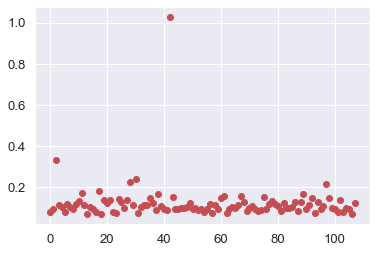

In [9]:
means_df = all_df.groupby('ID', as_index=False).mean()

plt.plot(range(len(means_df['FramewiseDisplacement'])), means_df['FramewiseDisplacement'], 'ro')
plt.show()

In [10]:
means_df

,ID,CSF,Cosine00,Cosine01,Cosine02,Cosine03,Cosine04,Cosine05,FramewiseDisplacement,GlobalSignal,...,aCompCor05,non-stdDVARS,stdDVARS,tCompCor00,tCompCor01,tCompCor02,tCompCor03,tCompCor04,tCompCor05,vx-wisestdDVARS
0,1,6248.278169,8.577882e-19,3.311156e-13,-6.586588e-19,-3.311289e-13,-8.501294e-19,-2.207505e-13,0.081004,9637.422000,...,1.048565e-12,49.140018,1.006895,-6.070640e-13,3.863134e-13,8.278145e-13,-1.103753e-12,-2.207506e-13,-8.830023e-13,0.979504
1,10,6786.830664,2.450823e-19,6.892941e-20,-1.010965e-18,-2.144471e-19,-8.654470e-19,6.127059e-20,0.093190,9058.306994,...,3.863135e-13,48.817804,1.013533,-3.311261e-13,-3.311260e-13,-1.103751e-13,-2.759385e-13,2.207505e-13,4.415012e-13,0.992002
2,100,6581.360533,2.297647e-19,5.516824e-14,-6.356823e-19,-5.519129e-14,-9.803294e-19,-1.177336e-12,0.331408,8197.358436,...,5.518771e-13,67.149492,1.035853,-7.726267e-13,-3.311255e-13,2.207505e-13,4.966893e-13,4.966885e-13,-5.518762e-13,1.006750
3,102,6583.545541,9.114000e-19,-3.311481e-13,0.000000e+00,6.622505e-13,-8.348117e-19,-1.986755e-12,0.114712,9456.245353,...,6.622525e-13,47.000055,1.033542,-1.838118e-19,-1.214128e-12,-5.518767e-14,1.103756e-13,1.655630e-13,-2.207507e-13,1.007600
4,103,7361.276588,-6.892941e-20,3.311164e-13,-7.352470e-19,-2.757176e-19,-5.897294e-19,-2.207504e-13,0.104564,9414.987170,...,3.863131e-13,48.874219,1.041253,-7.174392e-13,3.311261e-13,-3.311260e-13,1.655631e-13,5.518775e-14,2.759384e-13,0.998740
5,104,6781.524491,9.114000e-19,2.207328e-13,-4.901647e-19,-2.207548e-13,-8.348117e-19,-8.830019e-13,0.081584,9968.041881,...,4.966887e-13,49.385431,1.016538,-3.863135e-13,9.933776e-13,-5.518763e-14,1.103753e-12,8.830020e-13,-4.966881e-13,0.996463
6,105,6496.317406,9.114000e-19,-4.415307e-13,0.000000e+00,4.414955e-13,-1.079894e-18,-2.649007e-12,0.117924,9271.868732,...,1.655626e-13,49.758918,1.030028,-1.103753e-13,-4.966889e-13,-2.207505e-13,5.518769e-14,-6.622514e-13,3.311261e-13,1.005985
7,106,7288.043797,1.225412e-18,3.311156e-13,-1.010965e-18,-3.311288e-13,-1.110529e-18,-2.207503e-13,0.103033,9780.983915,...,-1.103750e-13,46.079622,1.017378,8.278138e-13,8.278149e-13,-2.759383e-13,-1.103755e-13,6.622517e-13,1.710817e-12,0.995610
8,107,6972.142074,2.205741e-18,-2.207662e-13,-5.208000e-19,2.207477e-13,-1.110529e-18,-1.324503e-12,0.094504,8792.105343,...,-2.207504e-13,54.427458,1.019412,-7.726267e-13,4.415015e-13,-1.608353e-19,3.311255e-13,5.518751e-14,7.726268e-13,0.998976
9,108,7157.911521,8.577882e-19,2.207330e-13,-1.684941e-19,-2.207551e-13,-8.501294e-19,-8.830022e-13,0.118444,9240.922561,...,-4.415014e-13,50.967283,1.016027,8.830024e-13,-2.759382e-13,1.103754e-13,-9.933775e-13,-4.415010e-13,1.103750e-13,0.987947


In [11]:
mean = means_df['FramewiseDisplacement'].mean()
std = means_df['FramewiseDisplacement'].std()
print(mean, std)

0.12281709555235902 0.09568851712568335


In [12]:
for index, row in means_df.iterrows():
    if (row['FramewiseDisplacement'] >= mean + std * 2.3):
        print(row['FramewiseDisplacement'], row['ID'])

1.0281344828069694 30


In [13]:
for index, row in means_df.iterrows():
    if (row['FramewiseDisplacement'] >= 0.2):#mean + std * 2):
        print(row['FramewiseDisplacement'], row['ID'])

0.33140822896603966 100
0.2268374428110065 16
0.2409192601128323 18
1.0281344828069694 30
0.21554812458130523 88
